In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px

In [2]:
data=pd.read_csv("global terrorism.csv",encoding='iso-8859-1')

In [3]:
data.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [4]:
columns=data.columns
print("Columns:")
for column in columns:
      print(column)

Columns:
eventid
iyear
imonth
iday
approxdate
extended
resolution
country
country_txt
region
region_txt
provstate
city
latitude
longitude
specificity
vicinity
location
summary
crit1
crit2
crit3
doubtterr
alternative
alternative_txt
multiple
success
suicide
attacktype1
attacktype1_txt
attacktype2
attacktype2_txt
attacktype3
attacktype3_txt
targtype1
targtype1_txt
targsubtype1
targsubtype1_txt
corp1
target1
natlty1
natlty1_txt
targtype2
targtype2_txt
targsubtype2
targsubtype2_txt
corp2
target2
natlty2
natlty2_txt
targtype3
targtype3_txt
targsubtype3
targsubtype3_txt
corp3
target3
natlty3
natlty3_txt
gname
gsubname
gname2
gsubname2
gname3
gsubname3
motive
guncertain1
guncertain2
guncertain3
individual
nperps
nperpcap
claimed
claimmode
claimmode_txt
claim2
claimmode2
claimmode2_txt
claim3
claimmode3
claimmode3_txt
compclaim
weaptype1
weaptype1_txt
weapsubtype1
weapsubtype1_txt
weaptype2
weaptype2_txt
weapsubtype2
weapsubtype2_txt
weaptype3
weaptype3_txt
weapsubtype3
weapsubtype3_txt
weapty

In [5]:
data.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','gname':'Group','country_txt':'Country','region_txt':'Region','provstate':'State','city':'City','latitude':'latitude','longitude':'longitude','attacktype1_txt':'AttackType','target1':'Target','targtype1_txt':'TargetType','weaptype1_txt':'Weapon','nkill':'Kill','nwound':'Wound','summary':'Summary','motive':'Motive'},inplace=True)

In [6]:
data = data[['Year', 'Month', 'Day','Group','Country', 'Region', 'State', 'City', 'latitude', 'longitude', 'AttackType','Target', 'TargetType', 'Weapon', 'Kill', 'Wound', 'Summary', 'Motive']]

In [7]:
data.head()

,Year,Month,Day,Group,Country,Region,State,City,latitude,longitude,AttackType,Target,TargetType,Weapon,Kill,Wound,Summary,Motive
0,1970,7,2,MANO-D,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,Assassination,Julio Guzman,Private Citizens & Property,Unknown,1.0,0.0,NaN,NaN
1,1970,0,0,23rd of September Communist League,Mexico,North America,Federal,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),"Nadine Chaval, daughter",Government (Diplomatic),Unknown,0.0,0.0,NaN,NaN
2,1970,1,0,Unknown,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,Assassination,Employee,Journalists & Media,Unknown,1.0,0.0,NaN,NaN
3,1970,1,0,Unknown,Greece,Western Europe,Attica,Athens,37.997490,23.762728,Bombing/Explosion,U.S. Embassy,Government (Diplomatic),Explosives,NaN,NaN,NaN,NaN
4,1970,1,0,Unknown,Japan,East Asia,Fukouka,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,U.S. Consulate,Government (Diplomatic),Incendiary,NaN,NaN,NaN,NaN


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 18 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Year        181691 non-null  int64  
 1   Month       181691 non-null  int64  
 2   Day         181691 non-null  int64  
 3   Group       181691 non-null  object 
 4   Country     181691 non-null  object 
 5   Region      181691 non-null  object 
 6   State       181270 non-null  object 
 7   City        181257 non-null  object 
 8   latitude    177135 non-null  float64
 9   longitude   177134 non-null  float64
 10  AttackType  181691 non-null  object 
 11  Target      181055 non-null  object 
 12  TargetType  181691 non-null  object 
 13  Weapon      181691 non-null  object 
 14  Kill        171378 non-null  float64
 15  Wound       165380 non-null  float64
 16  Summary     115562 non-null  object 
 17  Motive      50561 non-null   object 
dtypes: float64(4), int64(3), object(11)
memory u

In [9]:
data.isnull().sum()

Year               0
Month              0
Day                0
Group              0
Country            0
Region             0
State            421
City             434
latitude        4556
longitude       4557
AttackType         0
Target           636
TargetType         0
Weapon             0
Kill           10313
Wound          16311
Summary        66129
Motive        131130
dtype: int64

In [10]:
data['Wound'] = data['Wound'].fillna(0).astype(int)
data['Kill'] = data['Kill'].fillna(0).astype(int)
data['Casualties'] = data['Kill'] + data['Wound']

<Figure size 1200x800 with 0 Axes>

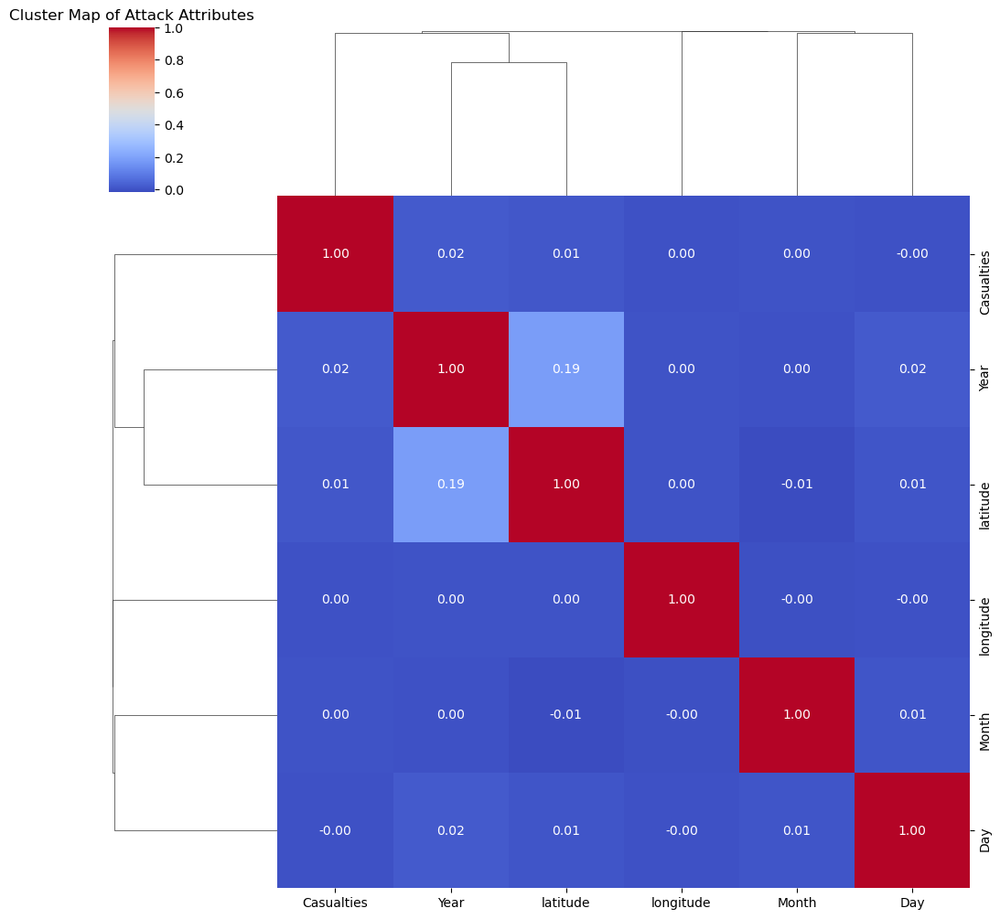

In [14]:
data= data.drop(['Kill', 'Wound'], axis=1)
data= data.fillna(0)
plt.figure(figsize=(12, 8))
sns.clustermap(data.corr(), cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Cluster Map of Attack Attributes')
plt.show()

In [15]:
data.describe()

,Year,Month,Day,latitude,longitude,Casualties
count,181691.000000,181691.000000,181691.000000,181691.000000,1.816910e+05,181691.000000
mean,2002.638997,6.467277,15.505644,22.909109,-4.471911e+02,5.150151
std,13.259430,3.388303,8.814045,18.699442,2.021946e+05,40.555414
min,1970.000000,0.000000,0.000000,-53.154613,-8.618590e+07,0.000000
25%,1991.000000,4.000000,8.000000,9.518645,1.231572e+00,0.000000
50%,2009.000000,6.000000,15.000000,31.126646,4.314357e+01,1.000000
75%,2014.000000,9.000000,23.000000,34.538561,6.835734e+01,4.000000
max,2017.000000,12.000000,31.000000,74.633553,1.793667e+02,9574.000000


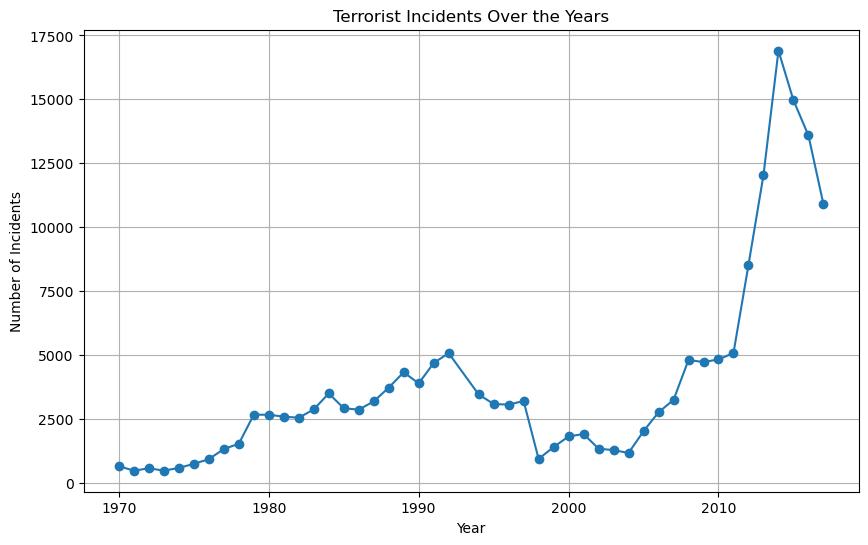

In [16]:
incidents_per_year = data.groupby('Year').size()
plt.figure(figsize=(10, 6))
plt.plot(incidents_per_year.index, incidents_per_year.values, marker='o')
plt.xlabel('Year')
plt.ylabel('Number of Incidents')
plt.title('Terrorist Incidents Over the Years')
plt.grid()
plt.show()

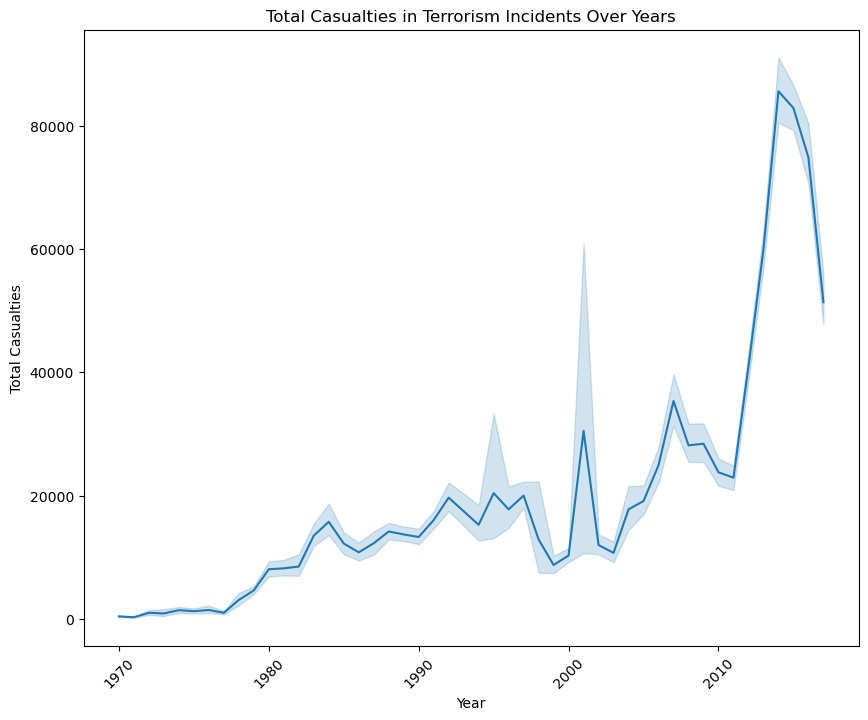

In [17]:
plt.figure(figsize=(10, 8))
sns.lineplot(data=data, x='Year', y='Casualties', estimator='sum')
plt.title('Total Casualties in Terrorism Incidents Over Years')
plt.xlabel('Year')
plt.ylabel('Total Casualties')
plt.xticks(rotation=45)
plt.show()

In [18]:
yearly_region_attacks = data.groupby(['Year', 'Region']).size().unstack()

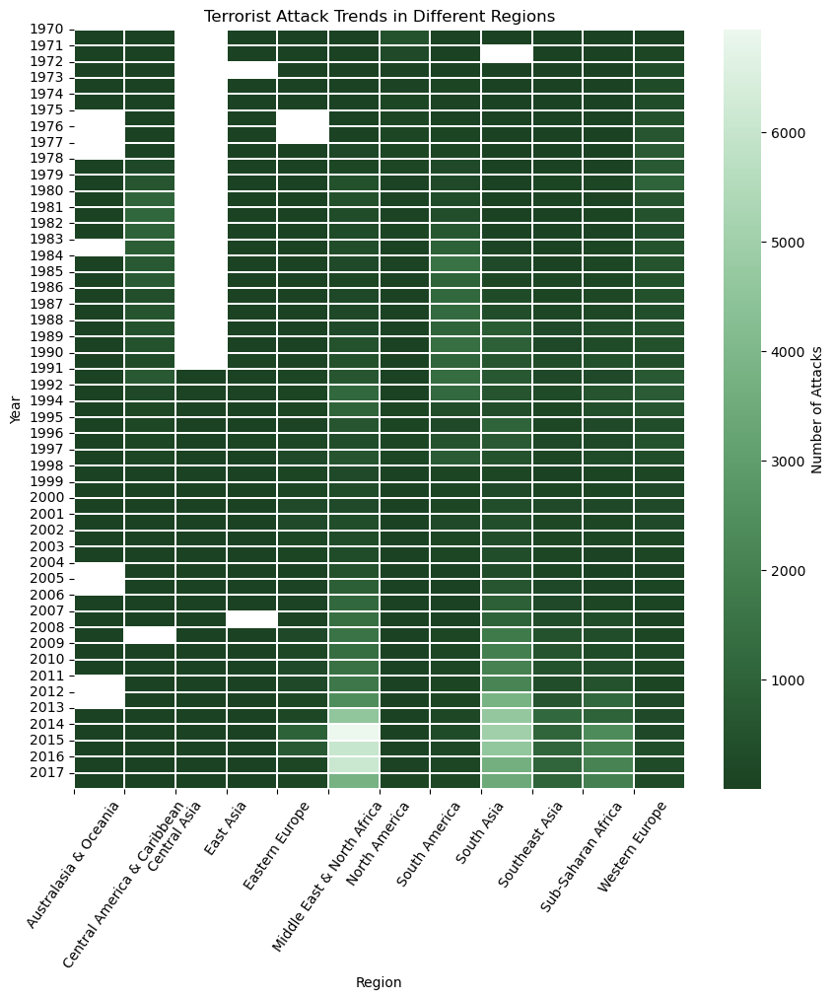

In [19]:
plt.figure(figsize=(10, 10))
cmap = sns.cubehelix_palette(start=2, rot=0, dark=0.2, light=0.95, reverse=True, as_cmap=True)
sns.heatmap(yearly_region_attacks, cmap=cmap, linewidths=0.01, linecolor='white', cbar_kws={'label': 'Number of Attacks'})
plt.title('Terrorist Attack Trends in Different Regions')
plt.xticks(np.arange(len(yearly_region_attacks.columns)), yearly_region_attacks.columns, rotation=55)
plt.yticks(np.arange(len(yearly_region_attacks)), yearly_region_attacks.index)
plt.xlabel('Region')
plt.ylabel('Year')
plt.show()

In [17]:
country_year_counts = data.groupby(['Country', 'Year']).size().reset_index(name='AttackCount')
max_attack_count = country_year_counts['AttackCount'].max()
plot_data = pd.merge(country_year_counts, data, on=['Country', 'Year'])
fig = px.choropleth(plot_data,
                    locations='Country',
                    locationmode='country names',
                    color='AttackCount',
                    title='Terrorist Attacks by Country',
                    labels={'AttackCount': 'Number of Attacks'},
                    hover_name='Country',
                    color_continuous_scale='Viridis',
                    animation_frame='Year',
                    range_color=(0, max_attack_count)) 

fig.show()

<Figure size 1200x600 with 0 Axes>

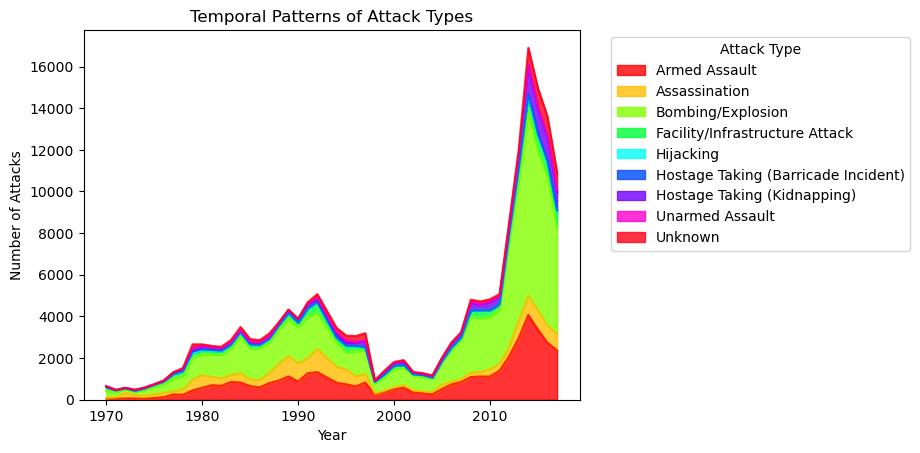

In [20]:
yearly_attack_type_counts = data.groupby(['Year', 'AttackType']).size().unstack()
plt.figure(figsize=(12, 6))
yearly_attack_type_counts.plot(kind='area', colormap='hsv', alpha=0.8)
plt.xlabel('Year')
plt.ylabel('Number of Attacks')
plt.title('Temporal Patterns of Attack Types')
plt.legend(title='Attack Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

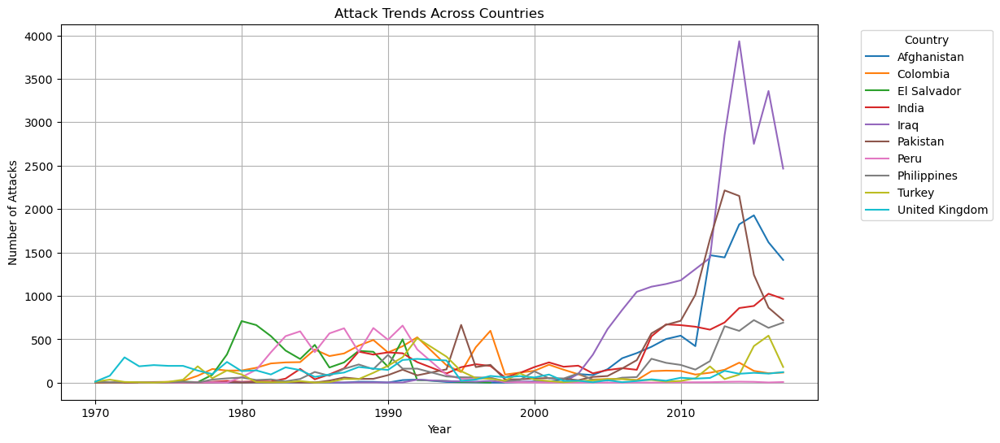

In [21]:
top_countries = data['Country'].value_counts().head(10).index
top_countries_data = data[data['Country'].isin(top_countries)]
country_year_attack_counts = top_countries_data.groupby(['Country', 'Year']).size().reset_index(name='AttackCount')
pivot_data = country_year_attack_counts.pivot(index='Year', columns='Country', values='AttackCount')
plt.figure(figsize=(12, 6))
sns.lineplot(data=pivot_data, dashes=False)
plt.xlabel('Year')
plt.ylabel('Number of Attacks')
plt.title('Attack Trends Across Countries')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show

<Figure size 1200x600 with 0 Axes>

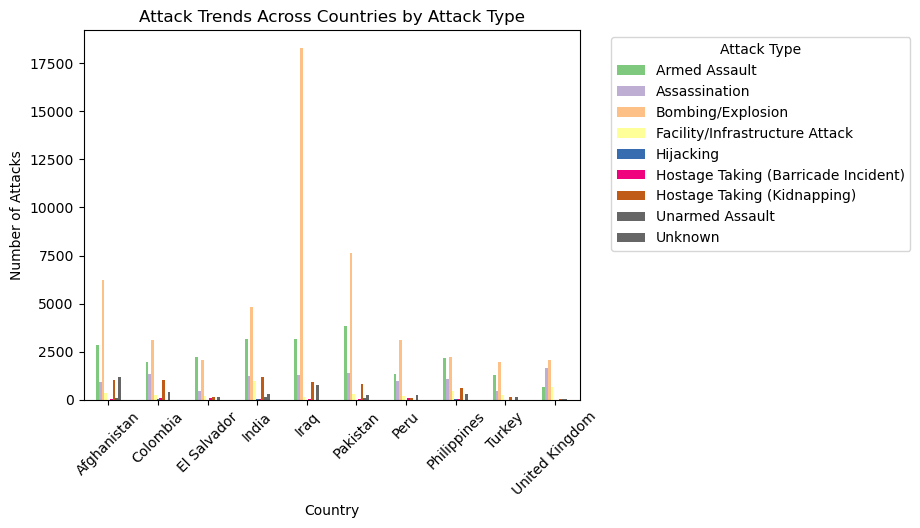

In [19]:
top_countries = data['Country'].value_counts().head(10).index
top_countries_data = data[data['Country'].isin(top_countries)]
country_attack_type_counts = top_countries_data.groupby(['Country', 'AttackType']).size().reset_index(name='AttackCount')
pivot_data = country_attack_type_counts.pivot(index='Country', columns='AttackType', values='AttackCount')
plt.figure(figsize=(12, 6))
pivot_data.plot(kind='bar', stacked=False, colormap='Accent')
plt.xlabel('Country')
plt.ylabel('Number of Attacks')
plt.title('Attack Trends Across Countries by Attack Type')
plt.legend(title='Attack Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.show()

In [23]:
data = data[['Year', 'AttackType']]
attack_type_counts = data.groupby(['Year', 'AttackType']).size().reset_index(name='AttackCount')
fig = px.sunburst(attack_type_counts, path=['Year', 'AttackType'], values='AttackCount')
fig.update_layout(title='Sunburst Chart of Attack Types Over Years')
fig.show()